# Классификация. Нейронные сети

Для выполнение данной работы был взят датасет с Kaggle [**Rain in Australia**](https://www.kaggle.com/datasets/jsphyg/weather-dataset-rattle-package/data).



**Описание работы**

**Цель работы:** изучение методов классификации данных, реализованные в библиотеке Scikit-Learn, а также ознакомление с нейронными сетями с использованием библиотек TensorFlow и TensorBoard.

**Постановка задачи:**

1. Необходимо выбрать и подготовить датасет для классификации, затем построить классификационные модели с помощью пяти методов:

- Наивный Байесовский классификатор (GaussianNB, MultinomialNB, ComplementNB, BernoulliNB);

- Деревья решений (Decision Tree);

- Линейный дискриминантный анализ (Linear Discriminant Analysis);

- Метод опорных векторов (Support Vector Machines);

- Метод ближайших соседей (k-Nearest Neighbors);

2. Затем сравните качество работы классификаторов с помощью следующих метрик:

- Accuracy (точность),

- Precision (доля правильно классифицированных положительных примеров),

- Recall (чувствительность, доля верно найденных положительных примеров),

- F1-Score (среднее гармоническое precision и recall),

- Площадь под кривой ROC (AUC-ROC).

3. Настройте гиперпараметры каждого метода и проведите исследование влияния различных параметров на качество классификации.

4. Реализуйте и протестируйте нейронную сеть на TensorFlow, исследуйте эффект настройки гиперпараметров и визуализируйте процесс обучения с помощью инструмента TensorBoard.

5. (Опционально на дополнительные баллы): Постройте нейронную сеть для классификации на TensorFlow. Организуйте 5-кратную кросс-валидацию для надежной оценки качества. Методом Grid Search с кросс-валидацией подберите оптимальную скорость обучения (3 различных значения) и архитектуру сети (3 варианта). Настройте TensorBoard для отслеживания accuracy / loss на каждом фолде. Сравнения различных конфигураций модели. Сравните финальную accuracy с baseline-моделью и проанализируйте эффект от настройки параметров.

In [4]:
import warnings
warnings.filterwarnings("ignore")

In [5]:
import pandas as pd
full_data = pd.read_csv('weatherAUS.csv')
full_data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


**Описание данных:**
Целевой переменной является `RainTomorrow`. Переменная является бинарной, где 0 - завтра нет дождя, 1 - есть

Признаки на основе готорых будут делаться предсказания выведены выше. Как видно, `RainToday` и `RainTomorrow` являются object (Yes/No), следовательно нужно их закодировать

In [6]:
full_data['RainToday'].replace({'No': 0, 'Yes': 1},inplace = True)
full_data['RainTomorrow'].replace({'No': 0, 'Yes': 1},inplace = True)

Так как дата не несет в себе никакой смысловой информации для

In [7]:
display(full_data.info())
full_data.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

None

(145460, 23)

Проверим на сбалансированность классов. Классы имеют соотношение 78:22, следоватьно присутствут имбаланс.

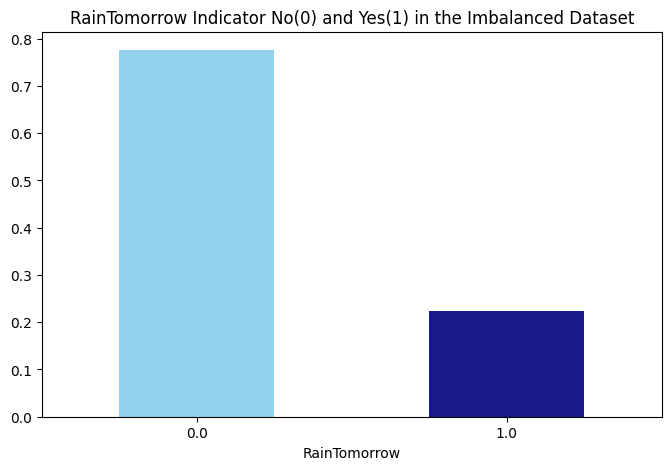

In [8]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (8,5))
full_data.RainTomorrow.value_counts(normalize = True).plot(kind='bar', color= ['skyblue','navy'], alpha = 0.9, rot=0)
plt.title('RainTomorrow Indicator No(0) and Yes(1) in the Imbalanced Dataset')
plt.show()

Для борьбы с имбалансом классов есть различные методы:
- SMOTE анализирует ближайших соседей класса-меньшинства и создает синтетические примеры, что позволяет балансировать классы.
- ADASYN работает аналогично SMOTE, но с добавлением адаптивности. Он уделяет больше внимания классам, которые более затруднительны для классификации, генерируя больше синтетических примеров для таких классов.
- Взвешивание классов, или Class Weighting. Этот метод позволяет учесть дисбаланс между классами в процессе обучения модели. Он основан на идее того, что модель будет штрафовать более сильно за ошибки в классе-меньшинстве, поощряя более точное предсказание. Принцип работы взвешивания классов заключается в присвоении разных весов каждому классу в зависимости от его доли в данных. Это позволяет модели лучше справляться с классом-меньшинством.
- Увеличение выборки заключается в добавлении дополнительных примеров класса-меньшинства, чтобы сделать его более представительным. Это можно сделать различными способами, например, путем дублирования существующих примеров, что мы в дальнейшем и сделаем

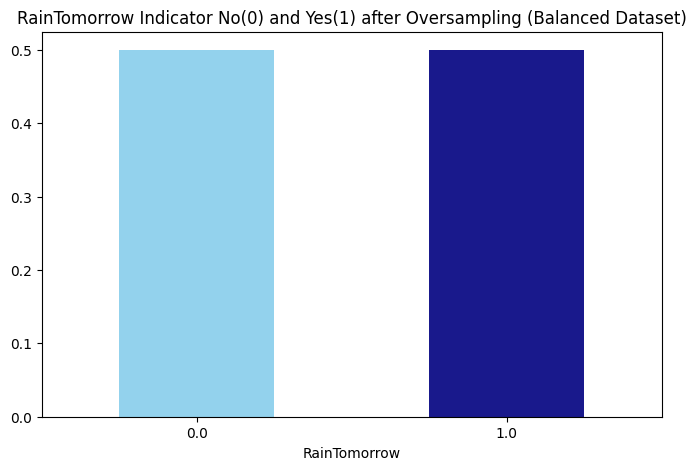

(220632, 23)

In [9]:
from sklearn.utils import resample

no = full_data[full_data.RainTomorrow == 0]
yes = full_data[full_data.RainTomorrow == 1]
yes_oversampled = resample(yes, replace=True, n_samples=len(no), random_state=123)
oversampled = pd.concat([no, yes_oversampled])

fig = plt.figure(figsize = (8,5))
oversampled.RainTomorrow.value_counts(normalize = True).plot(kind='bar', color= ['skyblue','navy'], alpha = 0.9, rot=0)
plt.title('RainTomorrow Indicator No(0) and Yes(1) after Oversampling (Balanced Dataset)')
plt.show()
oversampled.shape

Проверим данные на наличие пропущенных значений

In [10]:
total = oversampled.isnull().sum().sort_values(ascending=False)
percent = (oversampled.isnull().sum()/oversampled.isnull().count()).sort_values(ascending=False)
missing = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing

,Total,Percent
Sunshine,104831,0.475140
Evaporation,95411,0.432444
Cloud3pm,85614,0.388040
Cloud9am,81339,0.368664
Pressure3pm,21746,0.098562
Pressure9am,21728,0.098481
WindGustDir,15491,0.070212
WindGustSpeed,15354,0.069591
WindDir9am,14728,0.066754
WindDir3pm,6440,0.029189


Так как данные содержат менее 50% пропущенных значений. Категориальные переменные мы заполним наиболее частовстречающимися значениями(модой), а числовые заполним применив алгоритм **MICE** расшифровывается как Multiple Imputation by Chained Equations, многомерный способ заполнения пропущенных данных с помощью цепных уравнений.

In [11]:
oversampled['Date'] = oversampled['Date'].fillna(oversampled['Date'].mode()[0])
oversampled['Location'] = oversampled['Location'].fillna(oversampled['Location'].mode()[0])
oversampled['WindGustDir'] = oversampled['WindGustDir'].fillna(oversampled['WindGustDir'].mode()[0])
oversampled['WindDir9am'] = oversampled['WindDir9am'].fillna(oversampled['WindDir9am'].mode()[0])
oversampled['WindDir3pm'] = oversampled['WindDir3pm'].fillna(oversampled['WindDir3pm'].mode()[0])

Кодируем категориальные переменные применяя **LebelEncoder**

In [12]:
from sklearn.preprocessing import LabelEncoder
lencoders = {}
for col in oversampled.select_dtypes(include=['object']).columns:
    lencoders[col] = LabelEncoder()
    oversampled[col] = lencoders[col].fit_transform(oversampled[col])

In [13]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
MiceImputed = oversampled.copy(deep=True)
mice_imputer = IterativeImputer()
MiceImputed.iloc[:, :] = mice_imputer.fit_transform(oversampled)

In [14]:
MiceImputed.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,396,2,13.4,22.9,0.6,5.734653,7.446035,13,44.0,13,...,71.0,22.0,1007.7,1007.1,8.000000,4.848545,16.9,21.8,0.0,0.0
1,397,2,7.4,25.1,0.0,5.639329,11.520531,14,44.0,6,...,44.0,25.0,1010.6,1007.8,1.731945,2.625892,17.2,24.3,0.0,0.0
2,398,2,12.9,25.7,0.0,7.762688,12.348852,15,46.0,13,...,38.0,30.0,1007.6,1008.7,1.827673,2.000000,21.0,23.2,0.0,0.0
3,399,2,9.2,28.0,0.0,5.977293,11.811634,4,24.0,9,...,45.0,16.0,1017.6,1012.8,1.233996,2.116194,18.1,26.5,0.0,0.0
4,400,2,17.5,32.3,1.0,6.852837,5.728406,13,41.0,1,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0


In [15]:
MiceImputed.isna().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

После кодирования всех переменных избавимся от выбросов применяя метод межквартильного размаха

In [16]:
Q1 = MiceImputed.quantile(0.25)
Q3 = MiceImputed.quantile(0.75)
IQR = Q3 - Q1
IQR

Date             1535.000000
Location           25.000000
MinTemp             9.300000
MaxTemp            10.200000
Rainfall            2.400000
Evaporation         4.120044
Sunshine            5.979485
WindGustDir         9.000000
WindGustSpeed      19.000000
WindDir9am          8.000000
WindDir3pm          8.000000
WindSpeed9am       13.000000
WindSpeed3pm       11.000000
Humidity9am        26.000000
Humidity3pm        30.000000
Pressure9am         8.800000
Pressure3pm         8.800000
Cloud9am            4.000000
Cloud3pm            3.684676
Temp9am             9.300000
Temp3pm             9.800000
RainToday           1.000000
RainTomorrow        1.000000
dtype: float64

In [17]:
MiceImputed = MiceImputed[~((MiceImputed < (Q1 - 1.5 * IQR)) |(MiceImputed > (Q3 + 1.5 * IQR))).any(axis=1)]
MiceImputed.shape

(170669, 23)

Проверим данные на наличие мультиколлиниарности, для этого выведим тепловую карту кореляции. На графике видно, что `Date` и `Location` имеют практически нулевую корреляцию со всеми признаками, следовательно их можно удалить.

<Axes: >

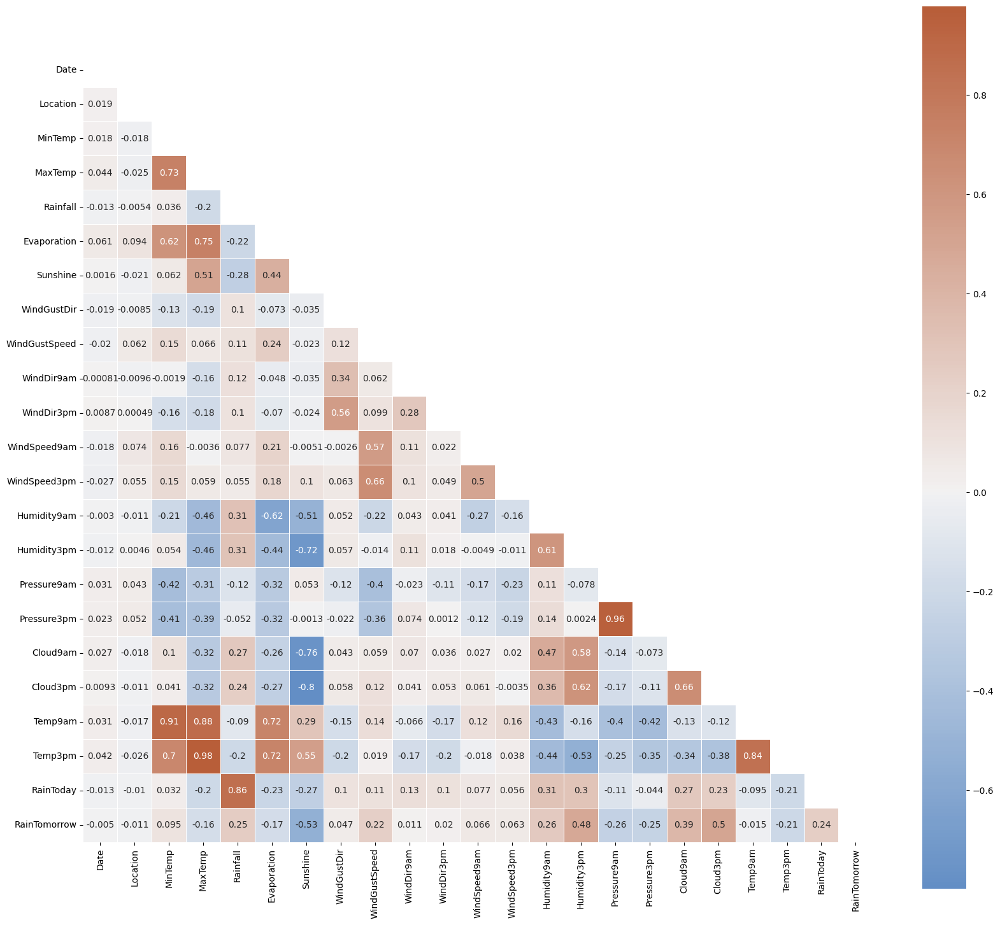

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
corr = MiceImputed.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(20, 20))
cmap = sns.diverging_palette(250, 25, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=None, center=0,square=True, annot=True, linewidths=.5, cbar_kws={"shrink": .9})

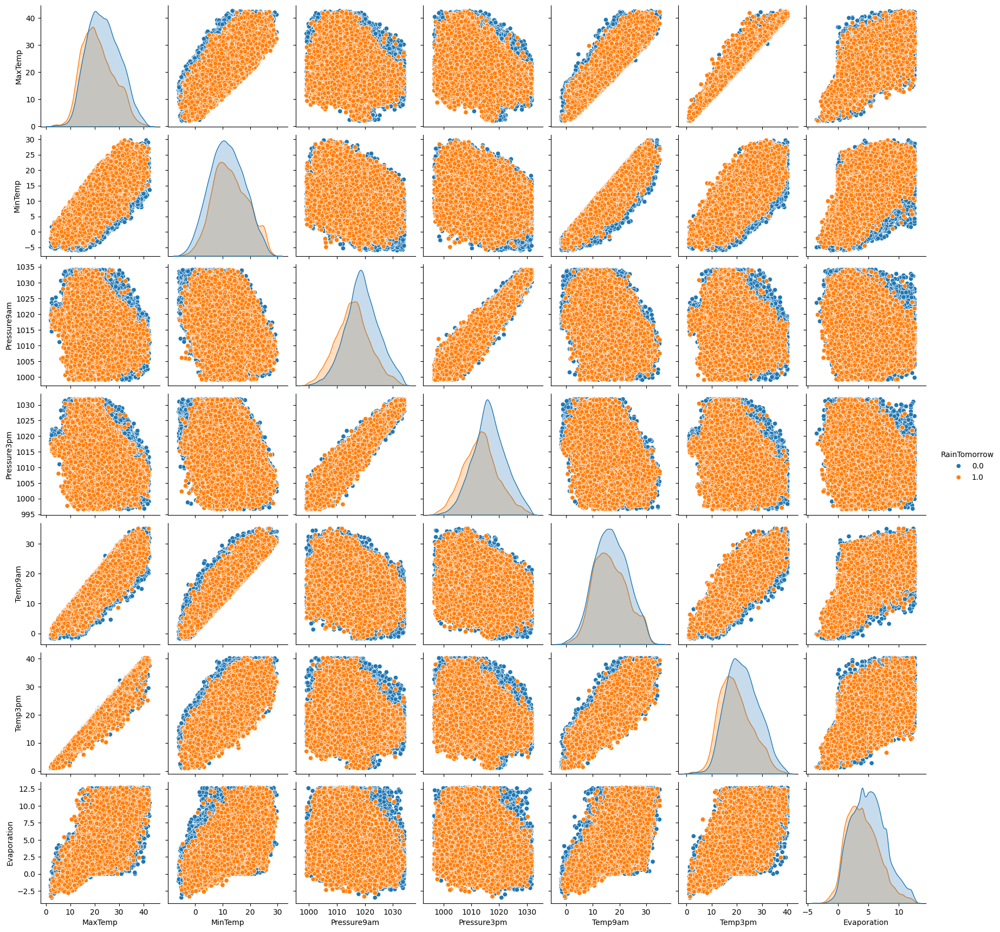

In [19]:
sns.pairplot( data=MiceImputed, vars=('MaxTemp','MinTemp','Pressure9am','Pressure3pm', 'Temp9am', 'Temp3pm', 'Evaporation'), hue='RainTomorrow' )

Не смотря на то, что график корреляция между признаками высокая, на диаграммах рассеивания видно, что зависимость не высокая, следовательно их можно не удалять
- MaxTemp and MinTemp
- Pressure9am and Pressure3pm
- Temp9am and Temp3pm
- Evaporation and MaxTemp
- MaxTemp and Temp3pm

Удаляем `Date` и `Location`

In [25]:
MiceImputed.drop(columns=['Date', 'Location'], inplace=True)

In [20]:
MiceImputed.head(3)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,396,2,13.4,22.9,0.6,5.734653,7.446035,13,44.0,13,...,71.0,22.0,1007.7,1007.1,8.000000,4.848545,16.9,21.8,0.0,0.0
1,397,2,7.4,25.1,0.0,5.639329,11.520531,14,44.0,6,...,44.0,25.0,1010.6,1007.8,1.731945,2.625892,17.2,24.3,0.0,0.0
2,398,2,12.9,25.7,0.0,7.762688,12.348852,15,46.0,13,...,38.0,30.0,1007.6,1008.7,1.827673,2.000000,21.0,23.2,0.0,0.0


Делим данные на тренировочную и тестовую выборку 75 на 25 и стандартизируем данные

In [21]:
features = MiceImputed[['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir',
                       'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
                       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm',
                       'RainToday']]
target = MiceImputed['RainTomorrow']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.25, random_state=12345)

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

# Обучение ml моделей

Функция для построения ROCкривой

In [22]:
def plot_roc_cur(fper, tper):
    plt.plot(fper, tper, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

Функция для обучения и вывода метрик и графиков наших моделей

In [23]:
import time
from sklearn.metrics import ConfusionMatrixDisplay, roc_curve, classification_report
def run_model(model, X_train, y_train, X_test, y_test, verbose=True):
    t0=time.time()
    if verbose == False:
        model.fit(X_train,y_train, verbose=0)
    else:
        model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    print(classification_report(y_test,y_pred,digits=5))

    probs = model.predict_proba(X_test)
    probs = probs[:, 1]
    fper, tper, thresholds = roc_curve(y_test, probs)
    plot_roc_cur(fper, tper)

    fig, ax = plt.subplots(figsize=(8, 6))
    ConfusionMatrixDisplay.from_estimator(
        model, X_test, y_test,
        cmap=plt.cm.Blues,
        normalize='all',
        ax=ax
    )
    plt.title('Confusion Matrix')
    plt.show()


    return model

Наивный Байесовский классификатор (GaussianNB, MultinomialNB, ComplementNB, BernoulliNB)
- Гауссовский наивный байесовский классификатор (GaussianNB) — вариант для работы с непрерывными признаками, которые имеют нормальное (гауссовское) распределение.

- Мультиномиальный наивный байесовский классификатор (MultinomialNB) — вариант для работы с дискретными признаками, которые имеют мультиномиальное распределение. Такие признаки часто встречаются в задачах классификации текстов, где они представляют собой количество вхождений в тексте.

- Комплементарный наивный байесовский классификатор (ComplementNB) — улучшенный вариант MultinomialNB, подходящий для несбалансированных наборов данных. Вместо оценки вероятности признака при заданном классе, алгоритм оценивает нормированный вес признака w_{ci} для класса c как вероятность признака при дополнении класса, то есть при всех остальных классах. Таким образом, алгоритм учитывает не только частоту признаков в классе, но и их отсутствие в других классах, что делает его менее чувствительным к смещению выборки.

- Бернуллиевский наивный байесовский классификатор (BernoulliNB) — ещё один вариант для работы с дискретными признаками, но которые имеют бернуллиевское распределение. В данном случае признаки представляют собой бинарные индикаторы наличия или отсутствия определённых свойств в объекте. Например, в задаче классификации текстов это может быть наличие или отсутствие определённых слов в тексте.

              precision    recall  f1-score   support

         0.0    0.80079   0.74777   0.77337     23879
         1.0    0.70432   0.76359   0.73276     18789

    accuracy                        0.75473     42668
   macro avg    0.75255   0.75568   0.75306     42668
weighted avg    0.75831   0.75473   0.75549     42668



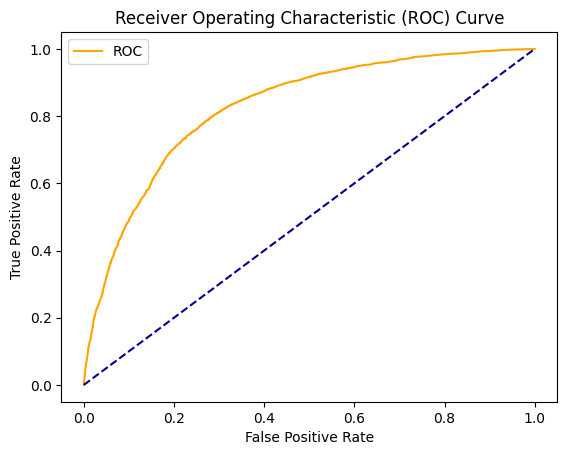

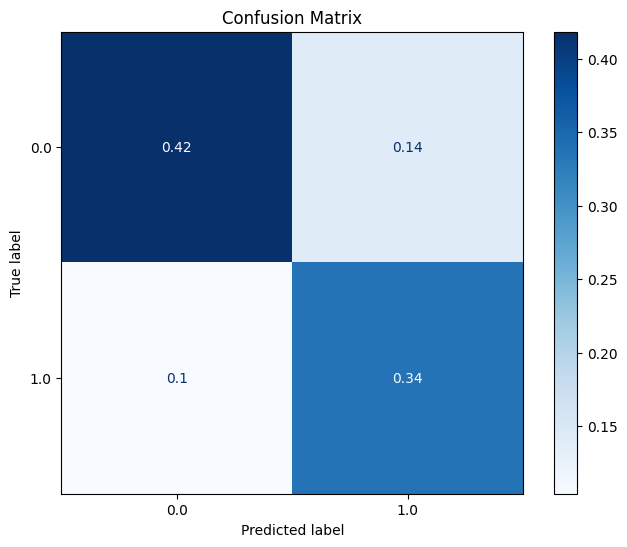

In [24]:
from sklearn.naive_bayes import BernoulliNB
clf = BernoulliNB()
model_CNB = run_model(clf, X_train, y_train, X_test, y_test)

Деревья решений (ДР) - это непараметрический метод контролируемого обучения, используемый для классификации и регрессии. Цель состоит в том, чтобы создать модель, которая предсказывает значение целевой переменной путем обучения простым правилам принятия решений, выведенным из характеристик данных. Дерево можно рассматривать как кусочно-постоянную аппроксимацию.


              precision    recall  f1-score   support

         0.0    0.88057   0.84941   0.86471     23879
         1.0    0.81685   0.85358   0.83481     18789

    accuracy                        0.85125     42668
   macro avg    0.84871   0.85150   0.84976     42668
weighted avg    0.85251   0.85125   0.85154     42668



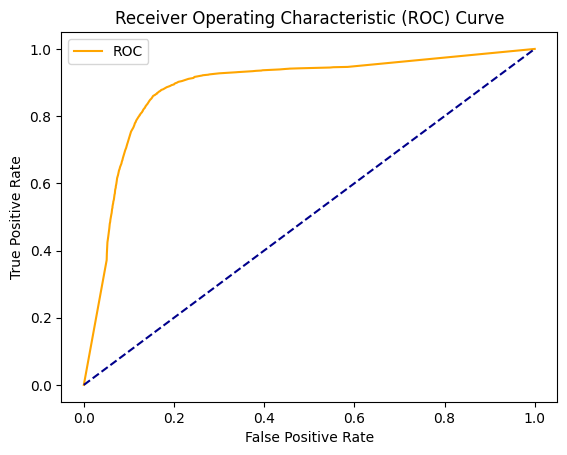

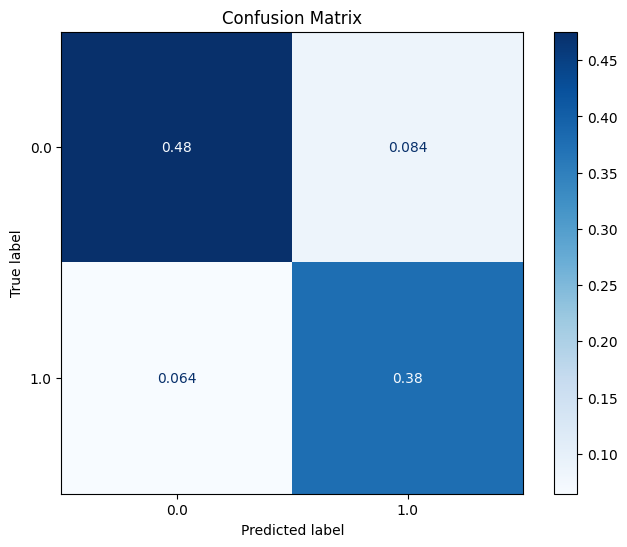

In [25]:
from sklearn.tree import DecisionTreeClassifier

params_dt = {'max_depth': 16,
             'max_features': "sqrt"}

model_dt = DecisionTreeClassifier(**params_dt)
model_dt = run_model(model_dt, X_train, y_train, X_test, y_test)

Линейный дискриминантный анализ (ЛДА), а также связанный с ним линейный дискриминант Фишера — методы статистики и машинного обучения для нахождения линейных комбинаций признаков, наилучшим образом разделяющих два или более класса объектов или событий. Полученная комбинация может быть использована в качестве линейного классификатора или для сокращения размерности пространства признаков перед последующей классификацией.

ЛДА представляет собой раздел многомерного статистического анализа, содержанием которого является разработка методов решения задач различения (дискриминации) объектов наблюдения по набору признаков. Иными словами, он позволяет изучать различия между двумя и более группами объектов по нескольким признакам одновременно.

              precision    recall  f1-score   support

         0.0    0.79874   0.84380   0.82065     23879
         1.0    0.78615   0.72979   0.75692     18789

    accuracy                        0.79359     42668
   macro avg    0.79244   0.78679   0.78879     42668
weighted avg    0.79319   0.79359   0.79259     42668



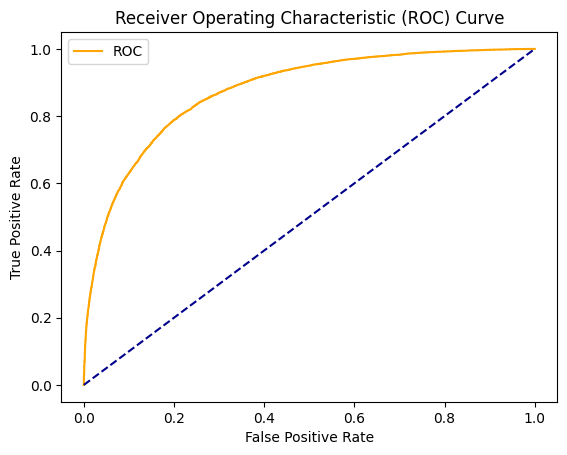

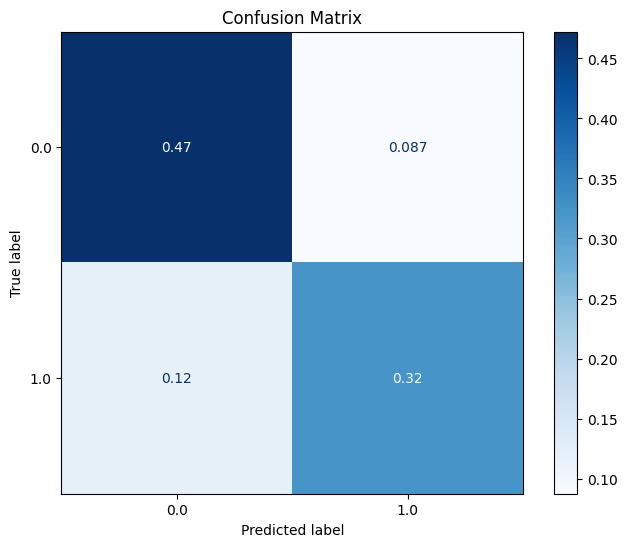

In [26]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

model_LDA = LinearDiscriminantAnalysis()
model_LDA = run_model(model_LDA, X_train, y_train, X_test, y_test)

Метод опорных векторов (Support Vector Machines - SVM) - это набор методов контролируемого обучения, используемых для классификации, регрессии и выявления выбросов.

Преимуществами Метода опорных векторов являются:

Эффективны в пространствах высокой размерности.

По-прежнему эффективны в случаях, когда число измерений больше числа выборок.

Использует подмножество обучающих точек в функции принятия решений (называемых опорными векторами), поэтому также эффективна с точки зрения памяти.

Универсальность: для функции принятия решений могут быть заданы различные Функциональные ядра. Предоставляются общие ядра, но можно указать и собственные.

К недостаткам Метода опорных векторов относятся:

Если число признаков намного больше числа выборок, то при выборе Функциональные ядра и термина регуляризации следует избегать переобучения.

SVM не предоставляют оценки вероятностей напрямую, они вычисляются с помощью дорогостоящей пятикратной кросс-валидации

              precision    recall  f1-score   support

         0.0    0.80370   0.83777   0.82038     23879
         1.0    0.78208   0.73995   0.76043     18789

    accuracy                        0.79469     42668
   macro avg    0.79289   0.78886   0.79041     42668
weighted avg    0.79418   0.79469   0.79398     42668



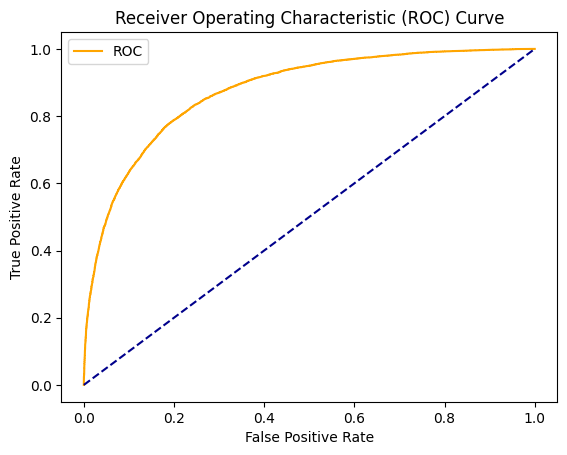

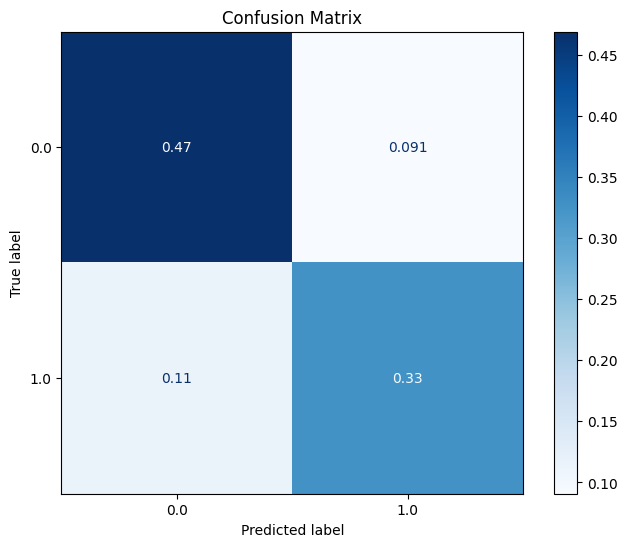

In [27]:
from sklearn.svm import LinearSVC
from sklearn.calibration import CalibratedClassifierCV

model_linear = LinearSVC(random_state=42, max_iter=10000)

model_calibrated = CalibratedClassifierCV(model_linear, method='sigmoid')
model_calibrated = run_model(model_calibrated, X_train, y_train, X_test, y_test)

Модуль sklearn.neighbors предоставляет функциональность для методов обучения на основе ближайших соседей с учителем и без учителя. Методы ближайших соседей без учителя лежат в основе многих других методов обучения, в частности, многомерного обучения и спектральной кластеризации. Методы ближайших соседей с учителем бывют двух видов: classification для данных с дискретными метками и regression для данных с непрерывными метками.

Принцип методов ближайших соседей заключается в том, чтобы найти заранее определенное количество обучающих образцов, наиболее близких по расстоянию к новой точке, и предсказать метку на их основе. Количество образцов может быть заданной пользователем константой (k-nearest neighbor learning - Метод K-ближайших соседей (KNN)) или меняться в зависимости от локальной плотности точек (radius-based neighbor learning).

Расстояние, в общем случае, может быть любой метрической мерой: стандартное евклидово расстояние является наиболее распространенным выбором.

Методы, основанные на соседях, известны как необобщающие методы машинного обучения, поскольку они просто “запоминают” все свои обучающие данные (возможно, преобразованные в быструю структуру индексации, такую как Ball Tree или KD Tree).

              precision    recall  f1-score   support

         0.0    0.89633   0.81536   0.85393     23879
         1.0    0.78951   0.88014   0.83236     18789

    accuracy                        0.84389     42668
   macro avg    0.84292   0.84775   0.84315     42668
weighted avg    0.84929   0.84389   0.84443     42668



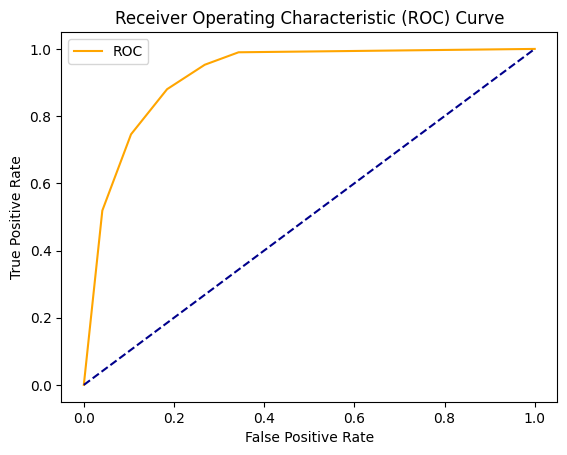

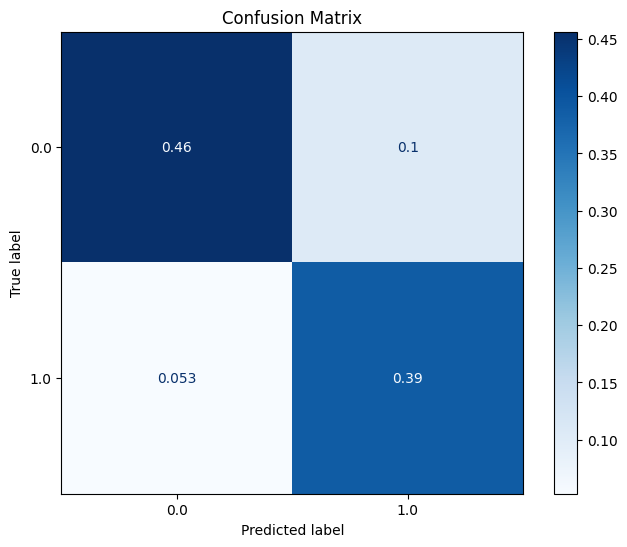

In [28]:
from sklearn.neighbors import KNeighborsClassifier

model_KNN = KNeighborsClassifier()
model_KNN = run_model(model_KNN, X_train, y_train, X_test, y_test)

## Подбор гипер параметров

In [33]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import classification_report, accuracy_score, f1_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import sys

def tune_and_evaluate_model(model, param_grid, X_train, y_train, X_test, y_test,
                                         search_method='grid', cv=3, scoring='f1_macro',
                                         model_name="Модель"):

    start_time = time.time()

    if search_method == 'grid':
        search = GridSearchCV(
            model, param_grid, cv=cv, scoring=scoring,
            n_jobs=1, verbose=2
        )
    else:
        search = RandomizedSearchCV(
            model, param_grid, cv=cv, scoring=scoring,
            n_jobs=1, verbose=2, n_iter=20, random_state=42
        )


    sys.stdout.flush()


    search.fit(X_train, y_train)


    y_pred = search.best_estimator_.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='macro')


    results = {
        'best_model': search.best_estimator_,
        'best_params': search.best_params_,
        'best_score': search.best_score_,
        'test_accuracy': accuracy,
        'test_f1': f1,

    }

    return results


Настройка BernoulliNB

Fitting 3 folds for each of 48 candidates, totalling 144 fits
[CV] END ...........alpha=0.01, binarize=0.0, fit_prior=True; total time=   0.0s
[CV] END ...........alpha=0.01, binarize=0.0, fit_prior=True; total time=   0.0s
[CV] END ...........alpha=0.01, binarize=0.0, fit_prior=True; total time=   0.0s
[CV] END ..........alpha=0.01, binarize=0.0, fit_prior=False; total time=   0.0s
[CV] END ..........alpha=0.01, binarize=0.0, fit_prior=False; total time=   0.0s
[CV] END ..........alpha=0.01, binarize=0.0, fit_prior=False; total time=   0.0s
[CV] END ...........alpha=0.01, binarize=0.1, fit_prior=True; total time=   0.0s
[CV] END ...........alpha=0.01, binarize=0.1, fit_prior=True; total time=   0.0s
[CV] END ...........alpha=0.01, binarize=0.1, fit_prior=True; total time=   0.0s
[CV] END ..........alpha=0.01, binarize=0.1, fit_prior=False; total time=   0.0s
[CV] END ..........alpha=0.01, binarize=0.1, fit_prior=False; total time=   0.0s
[CV] END ..........alpha=0.01, binarize=0.1, fi

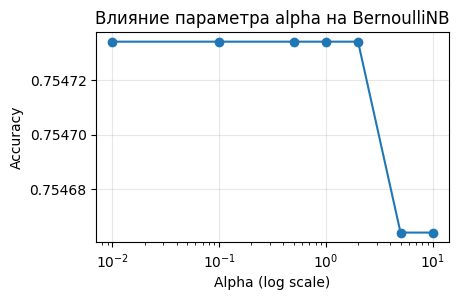

In [34]:
from sklearn.naive_bayes import BernoulliNB

param_grid_nb = {
    'alpha': [0.01, 0.1, 0.5, 1.0, 2.0, 5.0],
    'fit_prior': [True, False],
    'binarize': [0.0, 0.1, 0.5, 1.0]
}

model_nb = BernoulliNB()
results_nb = tune_and_evaluate_model(
    model_nb, param_grid_nb, X_train, y_train, X_test, y_test,
    search_method='grid'
)

print(f"Лучшие параметры: {results_nb['best_params']}")
print(f"Лучшая оценка CV: {results_nb['best_score']:.4f}")
print(f"Accuracy на тесте: {results_nb['test_accuracy']:.4f}")
print(f"F1-score на тесте: {results_nb['test_f1']:.4f}")


alphas = [0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
alpha_results = []
for alpha in alphas:
    model = BernoulliNB(alpha=alpha)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    alpha_results.append(accuracy)

import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.subplot(2, 2, 1)
plt.plot(alphas, alpha_results, marker='o')
plt.xscale('log')
plt.xlabel('Alpha (log scale)')
plt.ylabel('Accuracy')
plt.title('Влияние параметра alpha на BernoulliNB')
plt.grid(True, alpha=0.3)

Настройка DecisionTreeClassifier


Настройка DecisionTreeClassifier
Fitting 3 folds for each of 20 candidates, totalling 60 fits
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10, splitter=best; total time=   0.1s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10, splitter=best; total time=   0.1s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10, splitter=best; total time=   0.1s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, splitter=best; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, splitter=best; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_spl

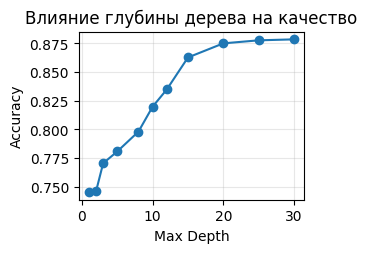

In [35]:
print("\n" + "=" * 50)
print("Настройка DecisionTreeClassifier")
print("=" * 50)

param_grid_dt = {
    'max_depth': [3, 5, 8, 10, 12, 15, 20, None],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 8],
    'max_features': ['sqrt', 'log2', None, 0.5, 0.8],
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random']
}

model_dt = DecisionTreeClassifier(random_state=42)
results_dt = tune_and_evaluate_model(
    model_dt, param_grid_dt, X_train, y_train, X_test, y_test,
    search_method='random'
)

print(f"Лучшие параметры: {results_dt['best_params']}")
print(f"Лучшая оценка CV: {results_dt['best_score']:.4f}")
print(f"Accuracy на тесте: {results_dt['test_accuracy']:.4f}")
print(f"F1-score на тесте: {results_dt['test_f1']:.4f}")

depths = [1, 2, 3, 5, 8, 10, 12, 15, 20, 25, 30]
depth_results = []
for depth in depths:
    model = DecisionTreeClassifier(max_depth=depth, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    depth_results.append(accuracy)

plt.subplot(2, 2, 2)
plt.plot(depths, depth_results, marker='o')
plt.xlabel('Max Depth')
plt.ylabel('Accuracy')
plt.title('Влияние глубины дерева на качество')
plt.grid(True, alpha=0.3)

Настройка LinearSVC

In [36]:
def tune_and_evaluate_model(model, param_grid, X_train, y_train, X_test, y_test,
                                         search_method='grid', cv=3, scoring='f1_macro',
                                         model_name="Модель"):


    if search_method == 'grid':
        search = GridSearchCV(
            model, param_grid, cv=cv, scoring=scoring,
            n_jobs=1, verbose=2
        )
    else:
        search = RandomizedSearchCV(
            model, param_grid, cv=cv, scoring=scoring,
            n_jobs=1, verbose=2, n_iter=20, random_state=42
        )

    sys.stdout.flush()


    search.fit(X_train, y_train)


    y_pred = search.best_estimator_.predict(X_test)


    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='macro')

    results = {
        'best_model': search.best_estimator_,
        'best_params': search.best_params_,
        'best_score': search.best_score_,
        'test_accuracy': accuracy,
        'test_f1': f1,
    }

    return results

print("\n" + "=" * 50)
print("Настройка LinearSVC с CalibratedClassifierCV")
print("=" * 50)


param_grid_svc = {
    'estimator__C': [0.01, 0.1, 1.0, 10.0],
    'estimator__loss': ['squared_hinge'],
    'estimator__penalty': ['l1', 'l2'],
    'cv': [3, 5]
}


base_svc = LinearSVC(random_state=42, max_iter=1000)


model_svc = CalibratedClassifierCV(base_svc)


results_svc = tune_and_evaluate_model(
    model_svc, param_grid_svc, X_train, y_train, X_test, y_test,
    search_method='random',
    cv=3
)

print(f"Лучшие параметры: {results_svc['best_params']}")
print(f"Лучшая оценка CV: {results_svc['best_score']:.4f}")
print(f"Accuracy на тесте: {results_svc['test_accuracy']:.4f}")
print(f"F1-score на тесте: {results_svc['test_f1']:.4f}")


print("\n" + "=" * 50)
print("Исследование влияния параметра C на LinearSVC")
print("=" * 50)

C_values = [0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0]
C_results = []

for C_val in C_values:

    base_model = LinearSVC(C=C_val, random_state=42, max_iter=10000)
    model = CalibratedClassifierCV(base_model, method='sigmoid', cv=3)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    C_results.append(accuracy)
    print(f"C={C_val}: Accuracy = {accuracy:.4f}")

print("\n" + "=" * 50)
print("Исследование методов калибровки для LinearSVC")
print("=" * 50)

calibration_methods = ['sigmoid', 'isotonic']
calibration_results = []

for method in calibration_methods:
    base_model = LinearSVC(C=1.0, random_state=42, max_iter=10000)
    model = CalibratedClassifierCV(base_model, method=method, cv=5)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    calibration_results.append(accuracy)
    print(f"Метод калибровки '{method}': Accuracy = {accuracy:.4f}")



Настройка LinearSVC с CalibratedClassifierCV
Fitting 3 folds for each of 16 candidates, totalling 48 fits
[CV] END cv=3, estimator__C=0.01, estimator__loss=squared_hinge, estimator__penalty=l1; total time=   4.7s
[CV] END cv=3, estimator__C=0.01, estimator__loss=squared_hinge, estimator__penalty=l1; total time=   5.2s
[CV] END cv=3, estimator__C=0.01, estimator__loss=squared_hinge, estimator__penalty=l1; total time=   6.4s
[CV] END cv=3, estimator__C=0.01, estimator__loss=squared_hinge, estimator__penalty=l2; total time=   1.2s
[CV] END cv=3, estimator__C=0.01, estimator__loss=squared_hinge, estimator__penalty=l2; total time=   1.8s
[CV] END cv=3, estimator__C=0.01, estimator__loss=squared_hinge, estimator__penalty=l2; total time=   1.5s
[CV] END cv=3, estimator__C=0.1, estimator__loss=squared_hinge, estimator__penalty=l1; total time=   4.9s
[CV] END cv=3, estimator__C=0.1, estimator__loss=squared_hinge, estimator__penalty=l1; total time=   5.8s
[CV] END cv=3, estimator__C=0.1, estima

Настройка LinearDiscriminantAnalysis

In [37]:
print("\n" + "=" * 50)
print("Настройка LinearDiscriminantAnalysis")
print("=" * 50)

param_grid_lda = {
    'solver': ['svd', 'lsqr', 'eigen'],
    'shrinkage': [None, 'auto', 0.1, 0.3, 0.5, 0.7, 0.9],
    'store_covariance': [True, False],
    'tol': [1e-4, 1e-3, 1e-2]
}

model_lda = LinearDiscriminantAnalysis()
results_lda = tune_and_evaluate_model(
    model_lda, param_grid_lda, X_train, y_train, X_test, y_test,
    search_method='grid'
)

print(f"Лучшие параметры: {results_lda['best_params']}")
print(f"Лучшая оценка CV: {results_lda['best_score']:.4f}")
print(f"Accuracy на тесте: {results_lda['test_accuracy']:.4f}")
print(f"F1-score на тесте: {results_lda['test_f1']:.4f}")


Настройка LinearDiscriminantAnalysis
Fitting 3 folds for each of 126 candidates, totalling 378 fits
[CV] END shrinkage=None, solver=svd, store_covariance=True, tol=0.0001; total time=   0.0s
[CV] END shrinkage=None, solver=svd, store_covariance=True, tol=0.0001; total time=   0.0s
[CV] END shrinkage=None, solver=svd, store_covariance=True, tol=0.0001; total time=   0.0s
[CV] END shrinkage=None, solver=svd, store_covariance=True, tol=0.001; total time=   0.0s
[CV] END shrinkage=None, solver=svd, store_covariance=True, tol=0.001; total time=   0.0s
[CV] END shrinkage=None, solver=svd, store_covariance=True, tol=0.001; total time=   0.1s
[CV] END shrinkage=None, solver=svd, store_covariance=True, tol=0.01; total time=   0.0s
[CV] END shrinkage=None, solver=svd, store_covariance=True, tol=0.01; total time=   0.0s
[CV] END shrinkage=None, solver=svd, store_covariance=True, tol=0.01; total time=   0.1s
[CV] END shrinkage=None, solver=svd, store_covariance=False, tol=0.0001; total time=   0.

Настройка KNeighborsClassifier


Настройка KNeighborsClassifier
KNeighborsClassifier
Заходим в функцию
Fitting 3 folds for each of 12 candidates, totalling 36 fits
[CV] END ...metric=euclidean, n_neighbors=3, weights=uniform; total time=   2.1s
[CV] END ...metric=euclidean, n_neighbors=3, weights=uniform; total time=   2.1s
[CV] END ...metric=euclidean, n_neighbors=3, weights=uniform; total time=   2.0s
[CV] END ..metric=euclidean, n_neighbors=3, weights=distance; total time=   2.0s
[CV] END ..metric=euclidean, n_neighbors=3, weights=distance; total time=   2.0s
[CV] END ..metric=euclidean, n_neighbors=3, weights=distance; total time=   2.0s
[CV] END ...metric=euclidean, n_neighbors=5, weights=uniform; total time=   4.1s
[CV] END ...metric=euclidean, n_neighbors=5, weights=uniform; total time=   4.3s
[CV] END ...metric=euclidean, n_neighbors=5, weights=uniform; total time=   4.2s
[CV] END ..metric=euclidean, n_neighbors=5, weights=distance; total time=   3.5s
[CV] END ..metric=euclidean, n_neighbors=5, weights=distan

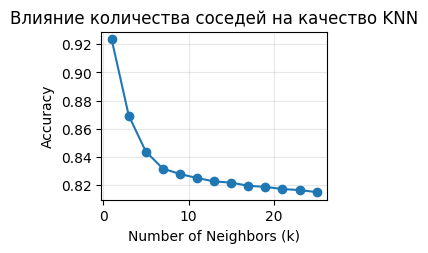

In [38]:
def tune_and_evaluate_model(model, param_grid, X_train, y_train, X_test, y_test,
                                         search_method='grid', cv=3, scoring='f1_macro',
                                         model_name="Модель"):

    if search_method == 'grid':
        search = GridSearchCV(
            model, param_grid, cv=cv, scoring=scoring,
            n_jobs=1, verbose=2
        )
    else:
        search = RandomizedSearchCV(
            model, param_grid, cv=cv, scoring=scoring,
            n_jobs=1, verbose=2, n_iter=20, random_state=42
        )

    search.fit(X_train, y_train)

    y_pred = search.best_estimator_.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='macro')

    results = {
        'best_model': search.best_estimator_,
        'best_params': search.best_params_,
        'best_score': search.best_score_,
        'test_accuracy': accuracy,
        'test_f1': f1,
    }

    return results

print("\n" + "=" * 50)
print("Настройка KNeighborsClassifier")
print("=" * 50)

param_grid_knn = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan'],
}
print('KNeighborsClassifier')
model_knn = KNeighborsClassifier()
print('Заходим в функцию')
results_knn = tune_and_evaluate_model(
    model_knn, param_grid_knn, X_train, y_train, X_test, y_test,
    search_method='grid'
)

print(f"Лучшие параметры: {results_knn['best_params']}")
print(f"Лучшая оценка CV: {results_knn['best_score']:.4f}")
print(f"Accuracy на тесте: {results_knn['test_accuracy']:.4f}")
print(f"F1-score на тесте: {results_knn['test_f1']:.4f}")

neighbors = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25]
neighbor_results = []
for k in neighbors:
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    neighbor_results.append(accuracy)

plt.subplot(2, 2, 3)
plt.plot(neighbors, neighbor_results, marker='o')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Accuracy')
plt.title('Влияние количества соседей на качество KNN')
plt.grid(True, alpha=0.3)

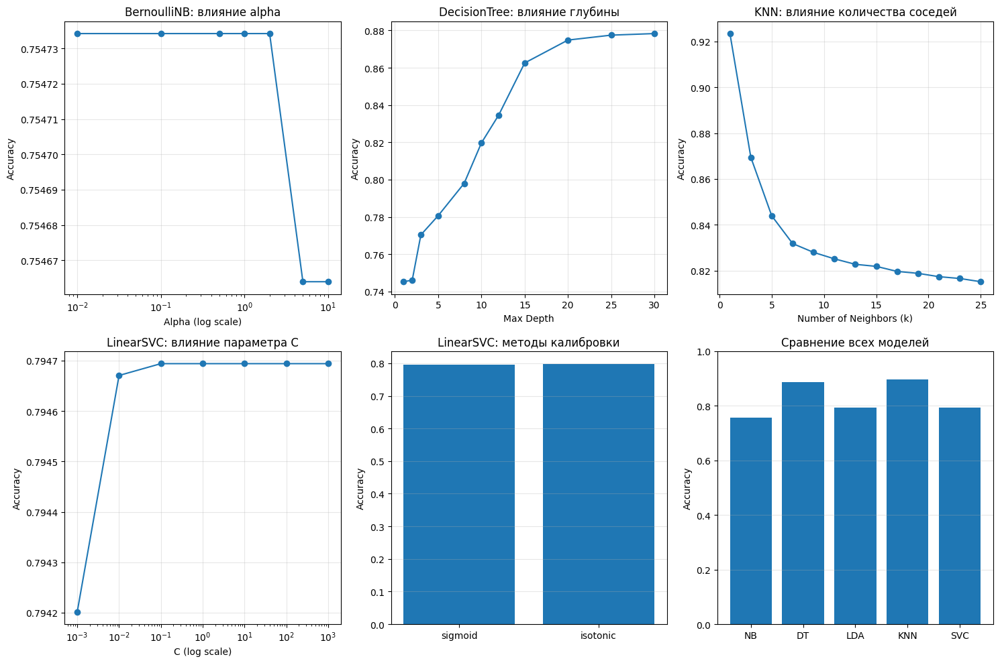


Сводная таблица результатов
       Model  Best CV Score  Test Accuracy  Test F1-Score
 BernoulliNB       0.755074       0.756281       0.754298
DecisionTree       0.877427       0.886214       0.885488
         LDA       0.788407       0.793592       0.788785
         KNN       0.884810       0.896503       0.896392
   LinearSVC       0.790401       0.794717       0.790427

Анализ кривых обучения
BernoulliNB: ['0.756', '0.757', '0.756', '0.756', '0.756', '0.756', '0.756', '0.756', '0.756', '0.756']
DecisionTree: ['0.748', '0.784', '0.805', '0.830', '0.837', '0.858', '0.871', '0.881', '0.891', '0.886']
LDA: ['0.793', '0.794', '0.794', '0.794', '0.794', '0.794', '0.794', '0.794', '0.794', '0.794']
KNN: ['0.814', '0.838', '0.854', '0.867', '0.875', '0.884', '0.890', '0.893', '0.895', '0.897']
LinearSVC: ['0.795', '0.795', '0.795', '0.796', '0.795', '0.795', '0.795', '0.795', '0.795', '0.795']


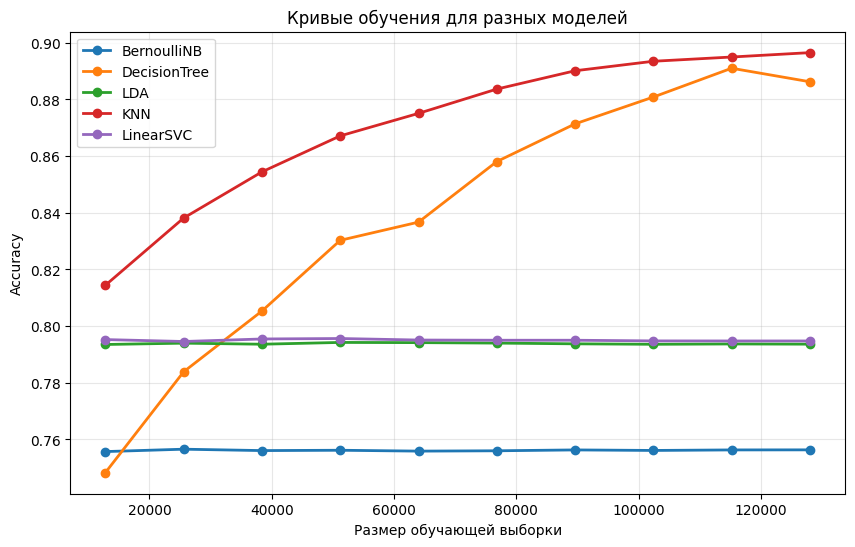


Анализ времени обучения и предсказания
BernoulliNB: обучение = 0.0465 сек, предсказание = 0.0148 сек
DecisionTree: обучение = 0.1130 сек, предсказание = 0.0118 сек
LDA: обучение = 0.1392 сек, предсказание = 0.0034 сек
KNN: обучение = 0.0104 сек, предсказание = 7.0573 сек
LinearSVC: обучение = 4.8257 сек, предсказание = 0.0140 сек


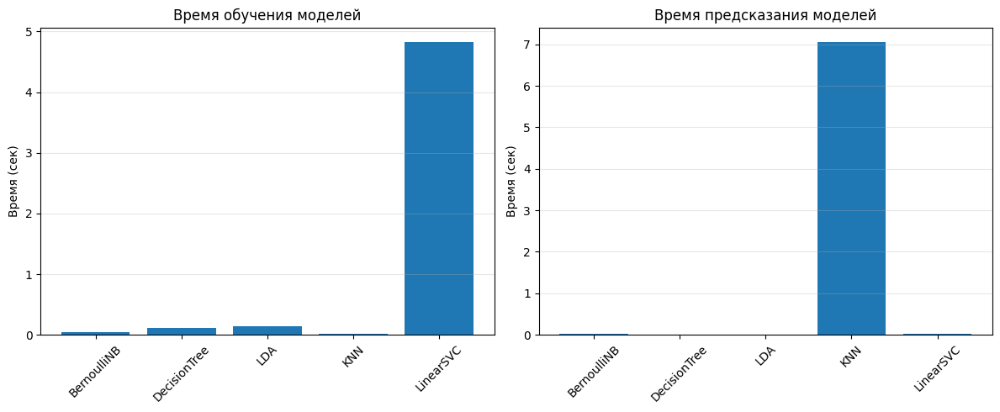

In [39]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

alphas = [0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
alpha_results = []
for alpha in alphas:
    model = BernoulliNB(alpha=alpha)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    alpha_results.append(accuracy)

axes[0, 0].plot(alphas, alpha_results, marker='o')
axes[0, 0].set_xscale('log')
axes[0, 0].set_xlabel('Alpha (log scale)')
axes[0, 0].set_ylabel('Accuracy')
axes[0, 0].set_title('BernoulliNB: влияние alpha')
axes[0, 0].grid(True, alpha=0.3)

depths = [1, 2, 3, 5, 8, 10, 12, 15, 20, 25, 30]
depth_results = []
for depth in depths:
    model = DecisionTreeClassifier(max_depth=depth, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    depth_results.append(accuracy)

axes[0, 1].plot(depths, depth_results, marker='o')
axes[0, 1].set_xlabel('Max Depth')
axes[0, 1].set_ylabel('Accuracy')
axes[0, 1].set_title('DecisionTree: влияние глубины')
axes[0, 1].grid(True, alpha=0.3)

neighbors = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25]
neighbor_results = []
for k in neighbors:
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    neighbor_results.append(accuracy)

axes[0, 2].plot(neighbors, neighbor_results, marker='o')
axes[0, 2].set_xlabel('Number of Neighbors (k)')
axes[0, 2].set_ylabel('Accuracy')
axes[0, 2].set_title('KNN: влияние количества соседей')
axes[0, 2].grid(True, alpha=0.3)

axes[1, 0].plot(C_values, C_results, marker='o')
axes[1, 0].set_xscale('log')
axes[1, 0].set_xlabel('C (log scale)')
axes[1, 0].set_ylabel('Accuracy')
axes[1, 0].set_title('LinearSVC: влияние параметра C')
axes[1, 0].grid(True, alpha=0.3)

x_pos = np.arange(len(calibration_methods))
axes[1, 1].bar(x_pos, calibration_results)
axes[1, 1].set_xticks(x_pos)
axes[1, 1].set_xticklabels(calibration_methods)
axes[1, 1].set_ylabel('Accuracy')
axes[1, 1].set_title('LinearSVC: методы калибровки')
axes[1, 1].grid(True, alpha=0.3, axis='y')

axes[1, 2].bar(['NB', 'DT', 'LDA', 'KNN', 'SVC'],
               [results_nb['test_accuracy'],
                results_dt['test_accuracy'],
                results_lda['test_accuracy'],
                results_knn['test_accuracy'],
                results_svc['test_accuracy']])
axes[1, 2].set_ylabel('Accuracy')
axes[1, 2].set_title('Сравнение всех моделей')
axes[1, 2].set_ylim(0, 1)
axes[1, 2].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

results_summary = pd.DataFrame({
    'Model': ['BernoulliNB', 'DecisionTree', 'LDA', 'KNN', 'LinearSVC'],
    'Best CV Score': [
        results_nb['best_score'],
        results_dt['best_score'],
        results_lda['best_score'],
        results_knn['best_score'],
        results_svc['best_score']
    ],
    'Test Accuracy': [
        results_nb['test_accuracy'],
        results_dt['test_accuracy'],
        results_lda['test_accuracy'],
        results_knn['test_accuracy'],
        results_svc['test_accuracy']
    ],
    'Test F1-Score': [
        results_nb['test_f1'],
        results_dt['test_f1'],
        results_lda['test_f1'],
        results_knn['test_f1'],
        results_svc['test_f1']
    ]
})

print("\n" + "=" * 50)
print("Сводная таблица результатов")
print("=" * 50)
print(results_summary.to_string(index=False))

best_models = {
    'BernoulliNB': results_nb['best_model'],
    'DecisionTree': results_dt['best_model'],
    'LDA': results_lda['best_model'],
    'KNN': results_knn['best_model'],
    'LinearSVC': results_svc['best_model']
}

print("\n" + "=" * 50)
print("Анализ кривых обучения")
print("=" * 50)

train_sizes = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
learning_curves = {}

for model_name, model in best_models.items():
    accuracies = []
    for size in train_sizes:
        n_samples = int(len(X_train) * size)
        X_subset = X_train[:n_samples]
        y_subset = y_train[:n_samples]

        from sklearn.base import clone
        temp_model = clone(model)
        temp_model.fit(X_subset, y_subset)
        y_pred = temp_model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        accuracies.append(accuracy)

    learning_curves[model_name] = accuracies
    print(f"{model_name}: {[f'{acc:.3f}' for acc in accuracies]}")

plt.figure(figsize=(10, 6))
for model_name, accuracies in learning_curves.items():
    plt.plot([int(len(X_train) * s) for s in train_sizes],
             accuracies, marker='o', label=model_name, linewidth=2)

plt.xlabel('Размер обучающей выборки')
plt.ylabel('Accuracy')
plt.title('Кривые обучения для разных моделей')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print("\n" + "=" * 50)
print("Анализ времени обучения и предсказания")
print("=" * 50)

import time

timing_results = {}
for model_name, model in best_models.items():

    start_time = time.time()
    model.fit(X_train, y_train)
    train_time = time.time() - start_time


    start_time = time.time()
    model.predict(X_test)
    predict_time = time.time() - start_time

    timing_results[model_name] = {
        'train_time': train_time,
        'predict_time': predict_time
    }

    print(f"{model_name}: обучение = {train_time:.4f} сек, предсказание = {predict_time:.4f} сек")


fig, axes = plt.subplots(1, 2, figsize=(12, 5))


train_times = [timing_results[m]['train_time'] for m in best_models.keys()]
axes[0].bar(best_models.keys(), train_times)
axes[0].set_ylabel('Время (сек)')
axes[0].set_title('Время обучения моделей')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(True, alpha=0.3, axis='y')


predict_times = [timing_results[m]['predict_time'] for m in best_models.keys()]
axes[1].bar(best_models.keys(), predict_times)
axes[1].set_ylabel('Время (сек)')
axes[1].set_title('Время предсказания моделей')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

# Обучение ИИ

In [ ]:
%load_ext tensorboard

In [ ]:
!rm -rf ./logs/

**Нейронная сеть** представляет собой структуру, состоящую из искусственных нейронов, определенным образом связанных друг с другом и внешней средой с помощью связей, каждая из которых имеет определенный коэффициент, на который умножается поступающее через него значение (эти коэффициенты называют весами).

Наиболее часто нейронные сети используются для решения следующих задач:

- Аппроксимация функций — восстановление функциональных зависимостей из обучающих данных.
- Классификация — определение принадлежности входного образа (объекта), представленного вектором признаков, к одному из предварительно заданных классов.
- Кластеризация — группировка объектов на основе близости их свойств.
- Прогнозирование — предсказание значения.
- Оптимизация — нахождение решения, удовлетворяющего системе ограничений и максимизирующим или минимизирующим целевую функцию.
- Ассоциативная память — память, адресуемая по содержанию, используемая в системах сверхбыстрого поиска.
- Управление — расчет такого входного воздействия на систему, при котором она следует по желаемой траектории.
- Распознавание речи и машинный перевод.

Оптимизаторы:
- Adam — один из самых эффективных алгоритмов оптимизации в обучении нейронных сетей. Он сочетает в себе идеи RMSProp и оптимизатора импульса. Вместо того чтобы адаптировать скорость обучения параметров на основе среднего первого момента (среднего значения), как в RMSProp, Adam также использует среднее значение вторых моментов градиентов. В частности, алгоритм вычисляет экспоненциальное скользящее среднее градиента и квадратичный градиент, а параметры beta1 и beta2 управляют скоростью затухания этих скользящих средних.
- Среднеквадратичное распространение корня (RMSprop) — это экспоненциально затухающее среднее значение. Существенным свойством RMSprop является то, что вы не ограничены только суммой прошлых градиентов, но вы более ограничены градиентами последних временных шагов. RMSprop вносит свой вклад в экспоненциально затухающее среднее значение прошлых «квадратичных градиентов». В RMSProp мы пытаемся уменьшить вертикальное движение, используя среднее значение, потому что они суммируются приблизительно до 0, принимая среднее значение. RMSprop предоставляет среднее значение для обновления.
- Мини-пакетный градиентный спуск стремится сбалансировать устойчивость стохастического градиентного спуска и эффективность пакетного градиентного спуска. Это наиболее распространенная реализация градиентного спуска, используемая в области глубокого обучения. В мини-пакетном SGD при обучении модели мы берем группу примеров (например, 32, 64 примера и т. д.). Такой подход работает лучше, потому что требуется единственный цикл для мини-пакетов, а не для каждого примера. Мини-пакеты выбираются случайным образом для каждой итерации, но почему? Когда мини-пакеты выбираются случайным образом, то при застревании в локальных минимумах некоторые шумные шаги могут привести к выходу из этих минимумов.

Борьба с переобучением:
- Наиболее эффективные методы борьбы с переобучением включают в себя различные техники регуляризации, такие как Dropout и сокращение весов. Как правило, модели с большим количеством параметров требуют больше тренировочных данных для успешного обобщения. Поэтому иногда уменьшение размера модели может помочь снизить степень переобучения. Наконец, одним из самых действенных способов борьбы с переобучением является создание ансамблей моделей. Однако этот метод иногда связан с повышенными вычислительными затратами.


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import datetime
from tensorflow.keras.callbacks import TensorBoard
import os

def create_model(input_shape):
    model = keras.Sequential([
        layers.Dense(64, activation='relu', input_shape=(input_shape,)),
        layers.Dropout(0.3),
        layers.Dense(32, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(1, activation='sigmoid')
    ])


    model.compile(
        optimizer='adam',
        loss='binary_crossentropy',
        metrics=['accuracy', keras.metrics.Precision(), keras.metrics.Recall()]
    )

    return model

input_shape = X_train.shape[1]

model = create_model(input_shape)

model.summary()

early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

model_checkpoint = keras.callbacks.ModelCheckpoint(
    'best_model.keras',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max'
)

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

history = model.fit(
    X_train, y_train,
    epochs=25,
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stopping, model_checkpoint, tensorboard_callback],
    verbose=1
)

model = keras.models.load_model('best_model.keras')


test_loss, test_accuracy, test_precision, test_recall = model.evaluate(X_test, y_test, verbose=0)

print(f"\nРезультаты на тестовых данных:")
print(f"Точность (Accuracy): {test_accuracy:.4f}")
print(f"Потери (Loss): {test_loss:.4f}")
print(f"Точность (Precision): {test_precision:.4f}")
print(f"Полнота (Recall): {test_recall:.4f}")

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,457 (13.50 KB)

 Trainable params: 3,457 (13.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/5
2120/2120 ━━━━━━━━━━━━━━━━━━━━ 33s 10ms/step - accuracy: 0.7496 - loss: 0.5087 - precision_1: 0.7303 - recall_1: 0.6695 - val_accuracy: 0.7874 - val_loss: 0.4469 - val_precision_1: 0.7509 - val_recall_1: 0.7568
Epoch 2/5
2120/2120 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.7873 - loss: 0.4554 - precision_1: 0.7674 - recall_1: 0.7409 - val_accuracy: 0.7939 - val_loss: 0.4358 - val_precision_1: 0.7716 - val_recall_1: 0.7401
Epoch 3/5
2120/2120 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.7891 - loss: 0.4512 - precision_1: 0.7711 - recall_1: 0.7380 - val_accuracy: 0.7984 - val_loss: 0.4251 - val_precision_1: 0.7680 - val_recall_1: 0.7612
Epoch 4/5
2120/2120 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.7946 - loss: 0.4424 - precision_1: 0.7797 - recall_1: 0.7411 - val_accuracy: 0.8119 - val_loss: 0.4105 - val_precision_1: 0.7837 - val_recall_1: 0.7774
Epoch 5/5
2120/2120 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8074 - loss: 0.4258 - precision_1: 0.7905 - recall_1

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import KFold
import numpy as np
import datetime

# Преобразуем данные в numpy массивы
X_train_np = X_train.values if hasattr(X_train, 'values') else X_train
X_test_np = X_test.values if hasattr(X_test, 'values') else X_test
y_train_np = y_train.values if hasattr(y_train, 'values') else y_train
y_test_np = y_test.values if hasattr(y_test, 'values') else y_test

# Убедимся, что форма данных правильная
print(f"X_train shape: {X_train_np.shape}")
print(f"y_train shape: {y_train_np.shape}")
print(f"X_test shape: {X_test_np.shape}")
print(f"y_test shape: {y_test_np.shape}")

# Определим размерность входных данных
input_dim = X_train_np.shape[1]
print(f"\nInput dimension: {input_dim}")

# Baseline модель для сравнения
def create_baseline_model(input_dim):
    model = keras.Sequential([
        layers.Dense(64, activation='relu', input_shape=(input_dim,)),
        layers.Dropout(0.2),
        layers.Dense(32, activation='relu'),
        layers.Dense(1, activation='sigmoid')  # Бинарная классификация
    ])
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=0.001),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    return model

# Функция для создания модели с заданной архитектурой и learning rate
def create_model(architecture, learning_rate, input_dim):
    model = keras.Sequential()
    model.add(layers.Dense(architecture[0], activation='relu', input_shape=(input_dim,)))

    for units in architecture[1:]:
        model.add(layers.Dense(units, activation='relu'))
        model.add(layers.Dropout(0.2))

    model.add(layers.Dense(1, activation='sigmoid'))

    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    return model

# Параметры для Grid Search
learning_rates = [0.001, 0.01, 0.1]
architectures = [
    [64, 32],
    [128, 64],
    [64, 32, 16]
]

# Оценка baseline модели
print("\nОценка Baseline модели")
baseline_model = create_baseline_model(input_dim)
history = baseline_model.fit(
    X_train_np, y_train_np,
    validation_data=(X_test_np, y_test_np),
    epochs=10,
    batch_size=32,
    verbose=1
)
baseline_loss, baseline_acc = baseline_model.evaluate(X_test_np, y_test_np, verbose=0)
print(f"\nBaseline модель - Test accuracy: {baseline_acc:.4f}, Test loss: {baseline_loss:.4f}")

# 5-кратная кросс-валидация с Grid Search
kf = KFold(n_splits=5, shuffle=True, random_state=42)
best_score = 0
best_params = {}
results = []

for lr in learning_rates:
    for arch in architectures:
        print(f"\nПроверка: LR={lr}, Архитектура={arch}")

        fold_scores = []
        fold_val_losses = []
        fold = 1

        for train_idx, val_idx in kf.split(X_train_np):
            # Подготовка данных для фолда
            x_train_fold = X_train_np[train_idx]
            y_train_fold = y_train_np[train_idx]
            x_val_fold = X_train_np[val_idx]
            y_val_fold = y_train_np[val_idx]

            # Создание TensorBoard логов для каждого фолда
            log_dir = f"logs/fit/lr_{lr}_arch_{'_'.join(map(str, arch))}_fold_{fold}"
            tensorboard_callback = tf.keras.callbacks.TensorBoard(
                log_dir=log_dir, histogram_freq=0
            )

            # Создание и обучение модели
            model = create_model(arch, lr, input_dim)

            history = model.fit(
                x_train_fold, y_train_fold,
                validation_data=(x_val_fold, y_val_fold),
                epochs=10,
                batch_size=32,
                callbacks=[tensorboard_callback],
                verbose=0
            )

            # Оценка на validation фолде
            val_loss, val_acc = model.evaluate(x_val_fold, y_val_fold, verbose=0)
            fold_scores.append(val_acc)
            fold_val_losses.append(val_loss)

            print(f"  Fold {fold}: val_acc = {val_acc:.4f}, val_loss = {val_loss:.4f}")
            fold += 1

        # Средние метрики по всем фолдам
        mean_acc = np.mean(fold_scores)
        std_acc = np.std(fold_scores)
        mean_loss = np.mean(fold_val_losses)

        results.append({
            'learning_rate': lr,
            'architecture': arch,
            'mean_accuracy': mean_acc,
            'std_accuracy': std_acc,
            'mean_loss': mean_loss
        })

        print(f"  Среднее по 5 фолдам: accuracy={mean_acc:.4f} (±{std_acc:.4f}), loss={mean_loss:.4f}")

        # Обновление лучших параметров
        if mean_acc > best_score:
            best_score = mean_acc
            best_params = {'learning_rate': lr, 'architecture': arch}

print(f"\nЛучшие параметры: {best_params}")
print(f"Лучшая средняя accuracy на кросс-валидации: {best_score:.4f}")


final_model = create_model(best_params['architecture'], best_params['learning_rate'], input_dim)

# TensorBoard для финальной модели
final_log_dir = "logs/final_model"
final_tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=final_log_dir, histogram_freq=0
)

# Callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=5, restore_best_weights=True
)

history_final = final_model.fit(
    X_train_np, y_train_np,
    validation_data=(X_test_np, y_test_np),
    epochs=30,
    batch_size=32,
    callbacks=[final_tensorboard_callback, early_stopping],
    verbose=1
)

# Оценка финальной модели
final_loss, final_acc = final_model.evaluate(X_test_np, y_test_np, verbose=0)

print(f"Baseline модель:")
print(f"  Test accuracy: {baseline_acc:.4f}")
print(f"  Test loss: {baseline_loss:.4f}")
print(f"\nФинальная модель (LR={best_params['learning_rate']}, Arch={best_params['architecture']}):")
print(f"  Test accuracy: {final_acc:.4f}")
print(f"  Test loss: {final_loss:.4f}")
print(f"\nУлучшение accuracy: {final_acc - baseline_acc:.4f}")
print(f"Улучшение loss: {baseline_loss - final_loss:.4f}")


# Сортируем результаты по accuracy
sorted_results = sorted(results, key=lambda x: x['mean_accuracy'], reverse=True)

for i, res in enumerate(sorted_results, 1):
    print(f"{i}. LR={res['learning_rate']}, Arch={res['architecture']}:")
    print(f"   Accuracy: {res['mean_accuracy']:.4f} (±{res['std_accuracy']:.4f})")
    print(f"   Loss: {res['mean_loss']:.4f}")



# Анализ learning rate
print("\n1. Эффект Learning Rate:")
for lr in learning_rates:
    lr_results = [r for r in results if r['learning_rate'] == lr]
    avg_acc = np.mean([r['mean_accuracy'] for r in lr_results])
    print(f"   LR={lr}: средняя accuracy = {avg_acc:.4f}")

# Анализ архитектуры
print("\n2. Эффект Архитектуры:")
arch_dict = {}
for arch in architectures:
    arch_str = str(arch)
    arch_results = [r for r in results if r['architecture'] == arch]
    avg_acc = np.mean([r['mean_accuracy'] for r in arch_results]) if arch_results else 0
    arch_dict[arch_str] = avg_acc
    print(f"   Arch={arch}: средняя accuracy = {avg_acc:.4f}")

X_train shape: (128001, 20)
y_train shape: (128001,)
X_test shape: (42668, 20)
y_test shape: (42668,)

Input dimension: 20

Оценка Baseline модели
Epoch 1/10
4001/4001 ━━━━━━━━━━━━━━━━━━━━ 19s 4ms/step - accuracy: 0.7817 - loss: 0.4597 - val_accuracy: 0.8102 - val_loss: 0.4141
Epoch 2/10
4001/4001 ━━━━━━━━━━━━━━━━━━━━ 18s 4ms/step - accuracy: 0.8178 - loss: 0.4065 - val_accuracy: 0.8384 - val_loss: 0.3739
Epoch 3/10
4001/4001 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - accuracy: 0.8367 - loss: 0.3755 - val_accuracy: 0.8453 - val_loss: 0.3572
Epoch 4/10
4001/4001 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - accuracy: 0.8438 - loss: 0.3592 - val_accuracy: 0.8517 - val_loss: 0.3433
Epoch 5/10
4001/4001 ━━━━━━━━━━━━━━━━━━━━ 14s 4ms/step - accuracy: 0.8472 - loss: 0.3507 - val_accuracy: 0.8527 - val_loss: 0.3359
Epoch 6/10
4001/4001 ━━━━━━━━━━━━━━━━━━━━ 18s 3ms/step - accuracy: 0.8505 - loss: 0.3417 - val_accuracy: 0.8561 - val_loss: 0.3283
Epoch 7/10
4001/4001 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - accuracy: 

In [ ]:
%tensorboard --logdir logs/fit